### Training a Single-Shot-Detector model to detect chop shops in aerial imagery
***

**Objective**: Detecting chop-shops sites from aeriel imagery, Using single shot detector




# Training SSD - no true negative samples


We began by creating samples of chop shops, using the **Training Samples Manager** in ArcGIS Pro.
We had a relatively small area to track samples at, and we were only able to detect around ***120*** samples of chop-shops.\
we also added a second class of parking places.
Due to their similarity, and a relativatly small amount of samples, it was naive to expect the model would be able to provide good results.

In [ ]:
#importing modules
import arcpy,arcgis
from arcgis import learn
import pandas as pd
from arcgis.features import GeoAccessor, GeoSeriesAccessor, SpatialDataFrame
import os
import warnings
from arcgis.learn import SingleShotDetector, prepare_data
from arcgis import GIS
import moduls.exp_Train,moduls.infer,moduls.layer_view
warnings.simplefilter(action='ignore', category=FutureWarning)
arcgis.env.verbose = False
import matplotlib.pyplot as plt
%matplotlib inline


In [11]:
exportTrainingSamplesSSD(outLocation = 'C:\Users\xyz\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples',
                         input_layer = 'Samples_only_cars')

'C:\\Users\\urial\\DeepLearningProjects\\slaghters\\presentation\\SSD\\onlyCars\\samples'

In [13]:
data_path = output_location
#data = prepare_data(data_path,class_mapping={1:'standart',2:'slagh',3:"const",4:"ground",5:"greenHouse"} ) 
data = prepare_data(data_path,class_mapping = {1:'standart',2:'slagh'} ) 
data.classes

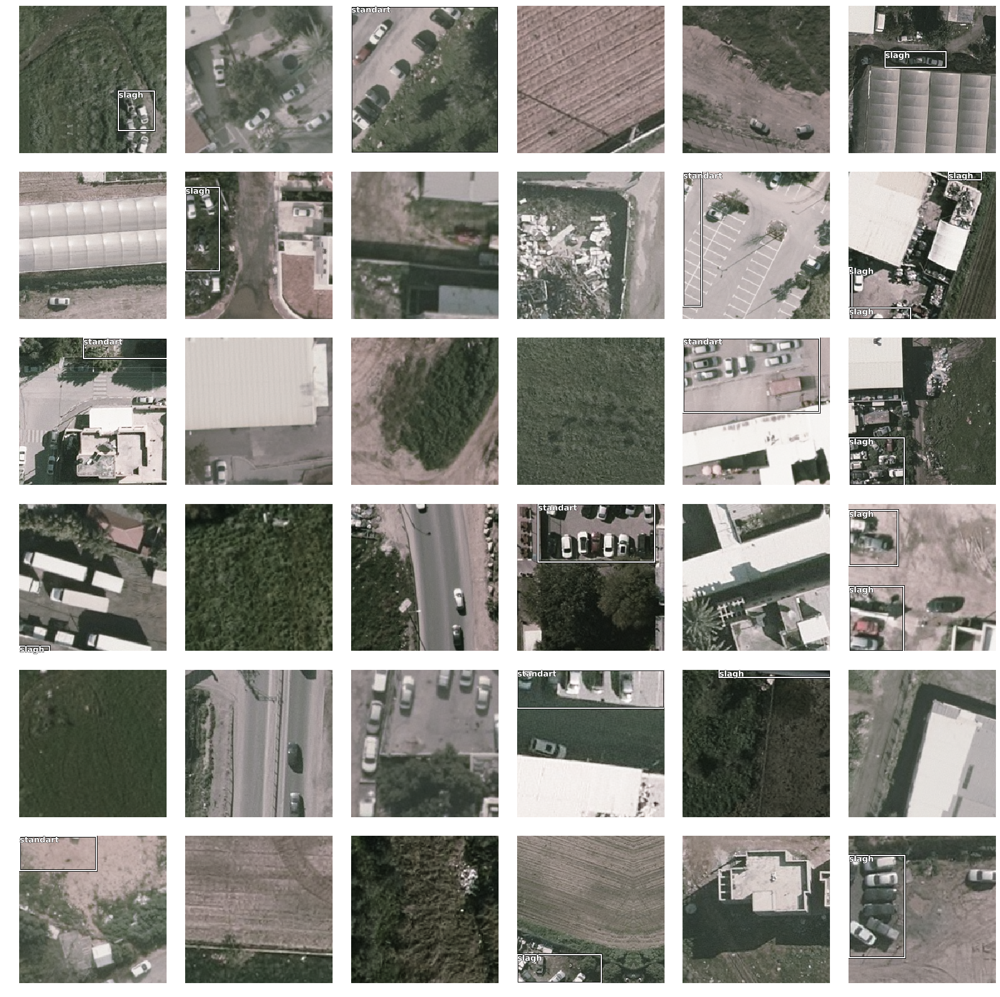

In [15]:
data.show_batch(rows= 6)

### Gaining intuition of the ssd main parameters in respect to our samples

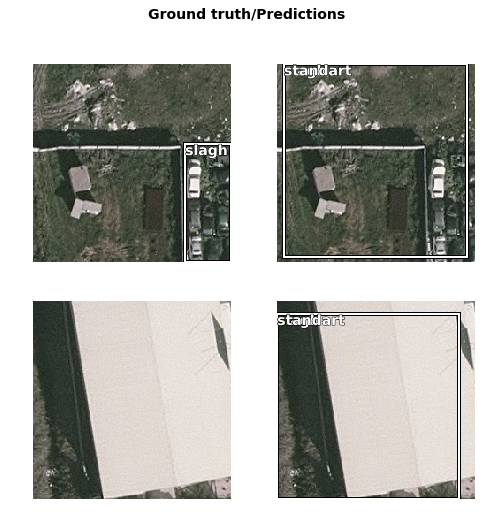

In [42]:
model = SingleShotDetector(data, grids=[1], zooms=[1], ratios=[[1.0, 1.0]])
model.show_results(rows=2,thresh=0.2)

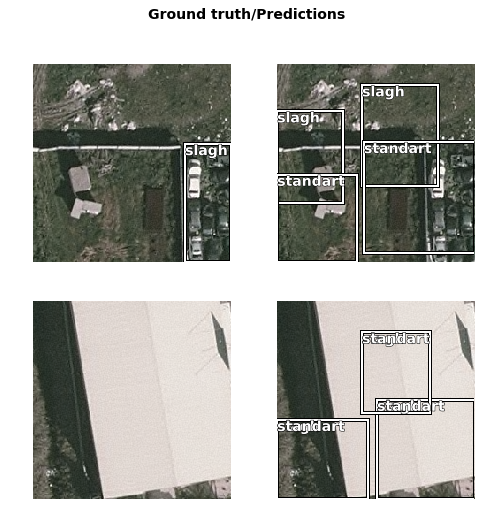

In [43]:
model = SingleShotDetector(data, grids=[2], zooms=[1], ratios=[[1.0, 1.0]])
model.show_results(rows=2,thresh=0.2)

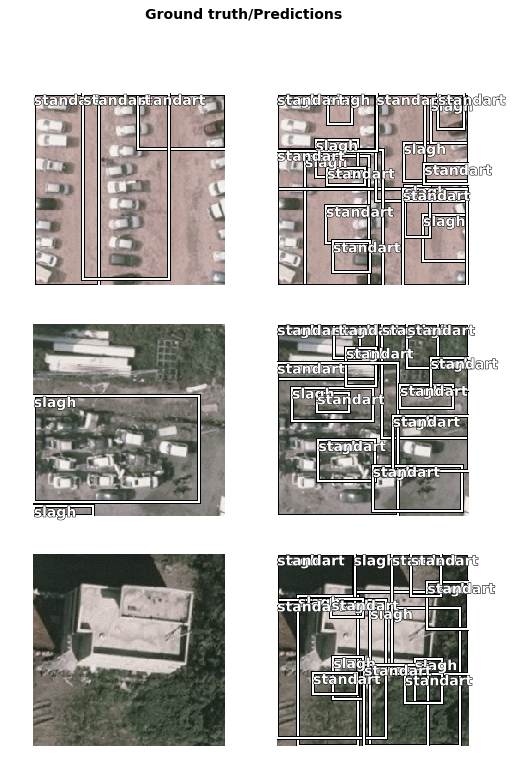

In [17]:
# Instantiating Single Shot Detector model:
model = SingleShotDetector(data, grids=[2], zooms=[0.5,1,1.5], ratios=[[1.0, 1.0],[1.0, 0.5], [0.5, 1.0]])
model.show_results(thresh=0.2,rows = 3)

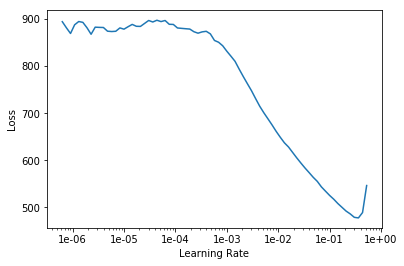

In [18]:
#finding the best rate for first epochs
model.lr_find()

In [19]:
model.fit(epochs=13, lr=slice(1e-6, 1e-2),early_stopping=True)

epoch,train_loss,valid_loss
1,139.059814,135.229080
2,128.715851,131.073898
3,122.529610,126.213501
4,115.965401,119.664589
5,112.809059,118.140648
6,112.135292,108.710564
7,108.491692,107.361435
8,105.039406,105.844231
9,101.427490,100.471169
10,99.332611,98.683823


saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
Created model files at C:\Users\urial\DeepLearningProjects\slaghters\presentation\SSD\onlyCars\samples\models\checkpoint
saving checkpoint.
C

{'slagh': 0.5687529208246893, 'standart': 0.5455965224925148}

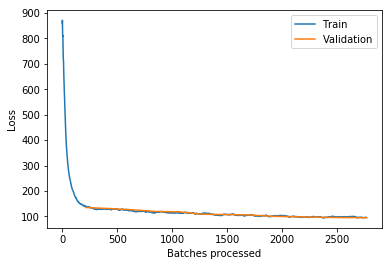

In [20]:
model.learn.recorder.plot_losses()
model.average_precision_score() 

keeps training with few more epoches with lower training rate.

we will also train the backbone model with **unfreeze()**

In [27]:
model.unfreeze()

In [28]:
model.fit(epochs=15, lr=slice(1e-6, 7e-5),early_stopping=True)

epoch,train_loss,valid_loss
1,96.433754,95.077675
2,97.019974,94.465950
3,93.457169,93.923615
4,94.666115,91.785942
5,92.217125,90.690025
6,91.790001,89.488823
7,90.576393,88.487846
8,87.016357,87.650803
9,90.470284,86.884048
10,89.332245,86.179192


In [29]:
model.save('SSD_slaghters_28e') 

WindowsPath('C:/Users/urial/DeepLearningProjects/slaghters/presentation/SSD/onlyCars/samples/models/SSD_slaghters_28e')

In [30]:
model.average_precision_score() 

{'slagh': 0.6090555509007487, 'standart': 0.5864747703794393}

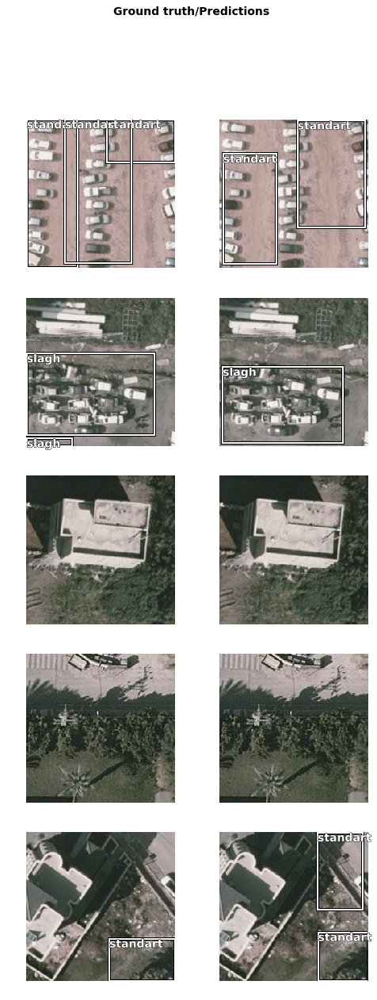

In [31]:
model.show_results(rows=5, thresh=0.2, nms_overlap=0.1)

# SSD detection
***
## Chop shops And Parking places Only


### [<img src=".\pic\SSD_NO_CLASSES.JPG" title="private parking" style="width:1000px;"/>](https://arcg.is/PHyCj)

In [35]:
#activate model detection
layer_name = detectObjects_arcpy(name_of_result_layer = 'SSDfeatureDetection'
                                 ,full_model_path =r'C:/Users/xyz/DeepLearningProjects/slaghters/presentation/SSD/onlyCars/samples/models/SSD_slaghters_28e/SSD_slaghters_28e.emd' )

AttributeError: 'ArcGISObjectDetector' object has no attribute 'updatePixels'

# SSD with True negatives samples
***


#### After examination of the results, there were too many false positives.we decided to provide true negatives samples.
#### we decided to provide true negatives samples, and train the model again, using the new samples as background.
### will it provide better over all predictions?

In [188]:
#funcion to view the layer data befor training

SSD_AllClasses,map2 = Access_and_view_layer('SamplesAllLabels')#view the layer and see all the classes

SSD_AllClasses.head()

,OBJECTID,Classcode,Classname,Classvalue,RED,GREEN,BLUE,Count,SHAPE
0,1,Code_1,Standart,1,133,199,126,27841,"{""hasM"": true, ""rings"": [[[194775.86153333914,..."
1,2,Code_1,Standart,1,133,199,126,26164,"{""hasM"": true, ""rings"": [[[194746.90353482682,..."
2,3,Code_1,Standart,1,133,199,126,32242,"{""hasM"": true, ""rings"": [[[194716.1604542127, ..."
3,4,Code_1,Standart,1,133,199,126,34748,"{""hasM"": true, ""rings"": [[[194665.3847855879, ..."
4,5,Code_1,Standart,1,133,199,126,22567,"{""hasM"": true, ""rings"": [[[194641.58369091898,..."


## *Classes distribution by area and count*
***

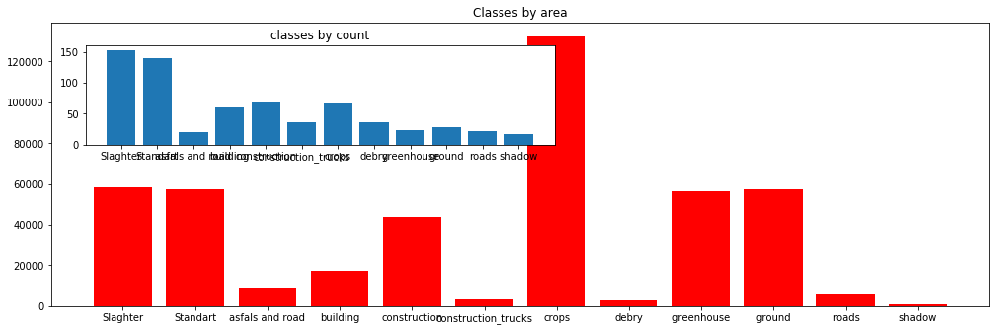

In [18]:
def set_shp_area(layer_variable):
    layer_variable['area'] = layer_variable.loc[:,'SHAPE'].apply(lambda x: x.area)#add shape area for each feature
    try:
        layer_variable.set_index('OBJECTID',inplace=True)
    except:
        pass
    return layer_variable

ssdDf = set_shp_area(SSD_AllClasses)

def DisplayLayer(layercheck):
    sum_groupe = layercheck[['Classname','area']].groupby(by='Classname').sum()
    count_groupe = layercheck[['Classname','Classvalue']].groupby(by='Classname').count()
    classes = layercheck[['Classname','Classvalue']].groupby(by = 'Classname').max()
    joinedDF = classes.merge(count_groupe,on= ['Classname'],suffixes=('', '_count')).merge(sum_groupe,on= ['Classname'],suffixes=('', ''))
    return joinedDF

layer_for_plot = DisplayLayer(ssdDf)

#function to plot the data
def plot_layer(layer_to_plot):  
    fig = plt.figure()
    axes = fig.add_axes([0.1,0.1,2.2,1])
    axes.bar(x=layer_to_plot.index,
        height=layer_to_plot['area'],color = 'r')
    axes.set_title('Classes by area')
    axesb = fig.add_axes([0.18,0.67,1.1,0.35])
    axesb.bar(x=layer_to_plot.index,
        height=layer_to_plot['Classvalue_count'])
    axesb.set_title('classes by count')
    
plot_layer(layer_for_plot)

## *Training the SSD model with Extra samples*
***

#### Process - minimized

In [ ]:
exportTrainingSamplesSSD(outLocation = r'C:\Users\xyz\DeepLearningProjects\slaghters\presentation\SSD\Allclasses\samples',
                         input_layer ='SamplesAllLabels')

In [133]:
output_location

'C:\\Users\\urial\\DeepLearningProjects\\slaghters\\presentation\\SSD\\onlyCars\\samples'

In [4]:
data_path = r'C:\Users\xyz\DeepLearningProjects\slaghters\presentation\SSD\Allclasses\samples2'

data = prepare_data(data_path,class_mapping = {1:'standart',2:'slagh',[3:13]:'Sbackground'} ) 
data.classes

['background', 'Sbackground', 'slagh', 'standart']

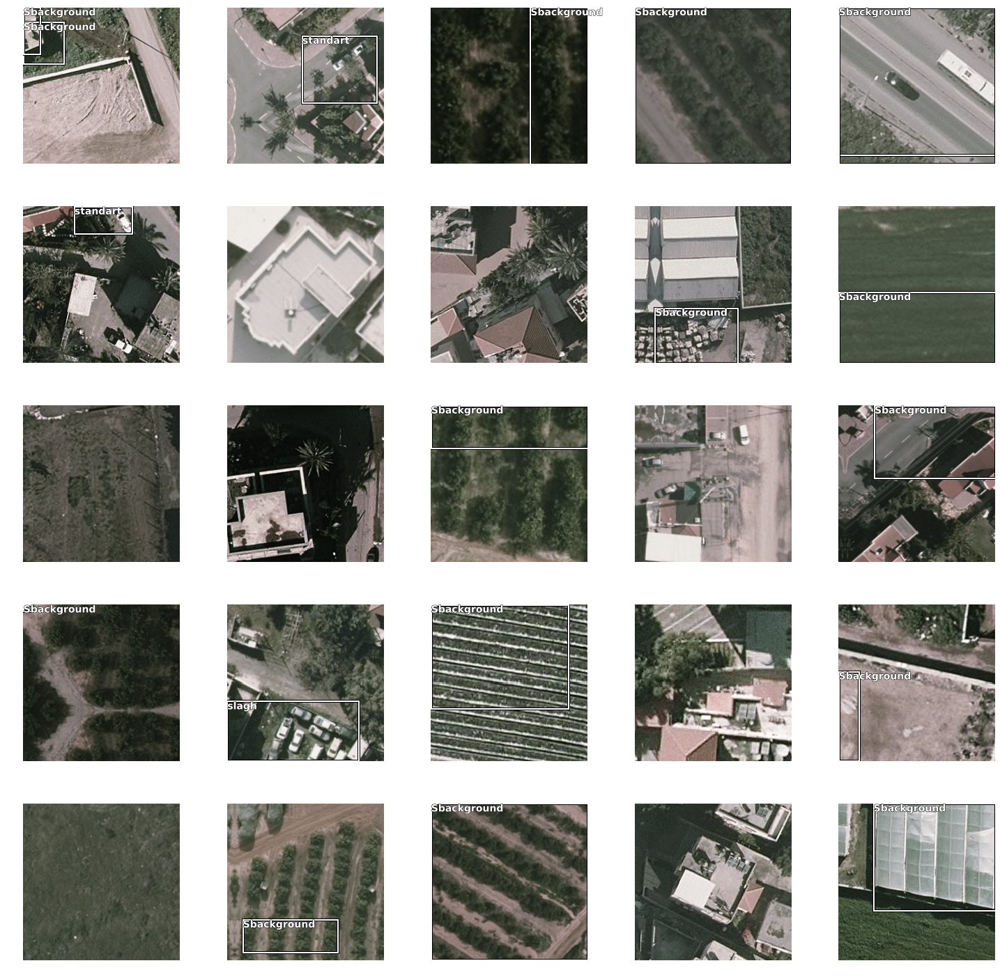

In [23]:
data.show_batch()

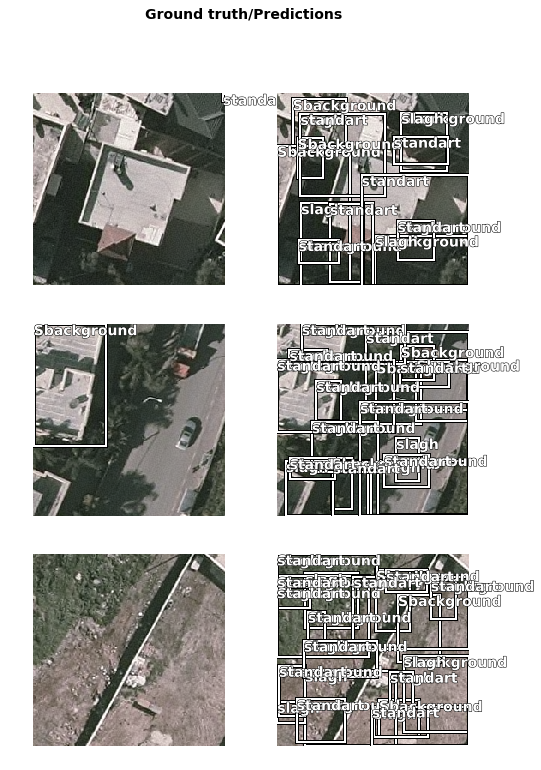

In [29]:

model2 = SingleShotDetector(data, grids=[2], zooms=[0.5,1,1.5], ratios=[[1.0, 1.0],[1.0, 0.5], [0.5, 1.0]])
model2.show_results(thresh=0.2,rows = 3)

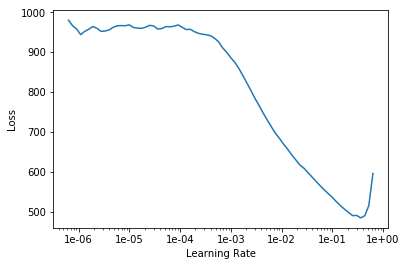

In [30]:
model2.lr_find()

In [33]:
model2.fit(epochs=18,
    lr=slice(0.0001, 1e-02),
    early_stopping=True)

epoch,train_loss,valid_loss
1,93.393097,96.564667
2,90.089699,93.962608
3,89.047775,89.480988
4,81.679657,90.059303
5,84.305016,87.554901
6,83.716461,83.695709
7,81.204712,85.722679
8,81.519623,81.330971
9,80.574081,80.129120
10,75.225334,78.928665


In [37]:
model2.unfreeze()

In [38]:
model2.fit(epochs=33,
    lr=slice(0.00001, 5e-05),
    early_stopping=True)

epoch,train_loss,valid_loss
1,69.669121,71.048531
2,69.969582,70.094261
3,70.753136,69.737579
4,69.833076,69.371437
5,68.078697,67.776070
6,68.304726,66.364052
7,64.331879,65.700272
8,63.797283,63.748722
9,62.825939,62.803642
10,60.685192,62.074223


In [39]:
model2.save('SSD_background_33E')

WindowsPath('C:/Users/urial/DeepLearningProjects/slaghters/presentation/SSD/Allclasses/samples2/models/SSD_background_33E')

#### *Training results - SSD with samples*

In [40]:
model2.average_precision_score() 

{'Sbackground': 0.6920582398556967,
 'slagh': 0.597840689736282,
 'standart': 0.6218630912395078}

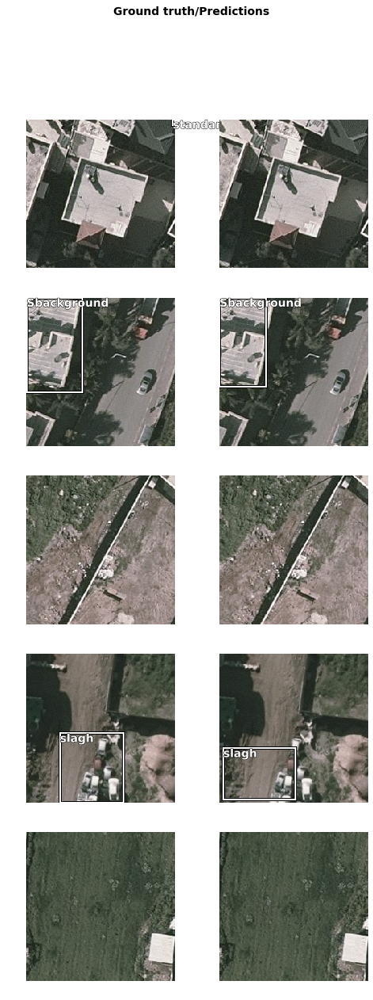

In [44]:
model2.show_results(thresh=0.2)

# SSD - detecting slaghters with true negative samples added
***

In [ ]:
detection_layer = detectObjects_arcpy(extent="",
                                      name_of_result_layer = "SSD_ALL_slaghters",
                                      full_model_path = r'C:\Users\xyz\DeepLearningProjects\slaghters\presentation\SSD\Allclasses\samples1\models\SSD30e\SSD30e.emd' )

AttributeError: 'ArcGISObjectDetector' object has no attribute 'updatePixels'

# Final results for SSD detection
***
### [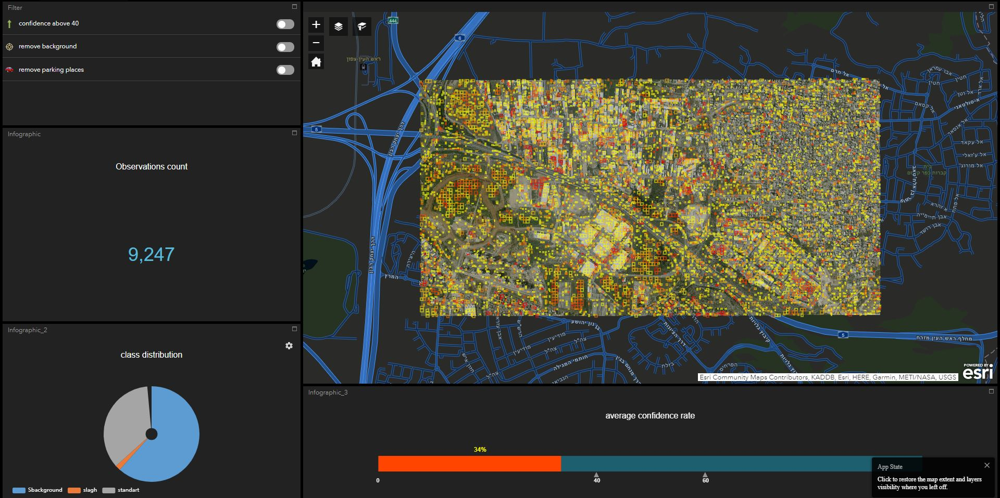](https://systematics.maps.arcgis.com/apps/webappviewer/index.html?id=5d6cb94664e945ac882e54701a4544a1)
